# **Big Data Analytics - Individual Final Project**

**Submitted By:** Aditya Rautela

**GH Number:** GH1033598

**Submitted To:** Prof. Narjes Nikzad

**Programme:** MSc Data Science, AI, and Digital Business

#**Business Case**

Singapore Airlines one of the most presdigious airline in the world of aviation always try to attain the top position in customer satisfaction. They have always tried to prove the world why they are higghest rated airline in the world.

Now with the recent growing trend of tourism and increasing use of various platforms to evaluate the services provided by various companies the customers have started giving and analysing reviews and sayings by the experience holders.

Similarly Singapore Airline is trying to assess their business position by the reviews they have received across the years.

They want to attain knowledege about their market situation and possibilities to improve as a company.

#**Key Business problem**

Identify ad address the customer issues and pain points to getter better in the industry and set new standards and accomplishment.

#**Objectives**

1. Try to assess the key terms being used in the reviews
2. Make the model understand specif words
3. Perform sentiment analysis
4. Prepare a model for further efficency.

# **Installing necessary libraries**

Starting with installing all the necessary libraries for the model building process.

In [ ]:
!pip install gensim
!pip install vaderSentiment
!python -m spacy download en_core_web_sm
!pip install transformers torch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 51.0 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 45.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 32.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━

# **Importing libraries**

Followed by installing we will import all the neccessary libraries needed for pipeline building into the notebook.

In [ ]:
import os
import re
import string
import seaborn as sns
import pandas as pd
import numpy as np
from string import punctuation

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import word_tokenize

nltk.download('stopwords')
nltk.download('punkt_tab')
nltk.download('wordnet')

import matplotlib.pyplot as plt
from wordcloud import WordCloud


import sklearn.linear_model
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import spacy
from spacy import displacy
from sklearn.linear_model import LogisticRegression

from imblearn.over_sampling import RandomOverSampler

from gensim.models import Word2Vec
from gensim.utils import simple_preprocess

import warnings
warnings.filterwarnings('ignore')

import torch
from torch import nn
from transformers import DistilBertTokenizer, Trainer, TrainingArguments, DistilBertForSequenceClassification

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


# **Loading dataset**

Our dataset which is taken from Kaggle as a source is loaded.

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("kanchana1990/singapore-airlines-reviews")

print("Path to dataset files:", path)

100%|██████████| 2.19M/2.19M [00:00<00:00, 91.7MB/s]

Extracting files...
Path to dataset files: /root/.cache/kagglehub/datasets/kanchana1990/singapore-airlines-reviews/versions/1


In [ ]:
print(os.listdir(path))

['singapore_airlines_reviews.csv']


In [ ]:
df = pd.read_csv(os.path.join(path, "singapore_airlines_reviews.csv"))

In [ ]:
df.head()

,published_date,published_platform,rating,type,text,title,helpful_votes
0,2024-03-12T14:41:14-04:00,Desktop,3,review,We used this airline to go from Singapore to L...,Ok,0
1,2024-03-11T19:39:13-04:00,Desktop,5,review,The service on Singapore Airlines Suites Class...,The service in Suites Class makes one feel lik...,0
2,2024-03-11T12:20:23-04:00,Desktop,1,review,"Booked, paid and received email confirmation f...",Don’t give them your money,0
3,2024-03-11T07:12:27-04:00,Desktop,5,review,"Best airline in the world, seats, food, servic...",Best Airline in the World,0
4,2024-03-10T05:34:18-04:00,Desktop,2,review,Premium Economy Seating on Singapore Airlines ...,Premium Economy Seating on Singapore Airlines ...,0


Our dataset has the following coloumns which are represented here.

# **Data Exploration**

It is important to get valuable insights about our data for which we will be doing exploration using some basic python functions and graphical representation.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   published_date      10000 non-null  object
 1   published_platform  10000 non-null  object
 2   rating              10000 non-null  int64 
 3   type                10000 non-null  object
 4   text                10000 non-null  object
 5   title               9999 non-null   object
 6   helpful_votes       10000 non-null  int64 
dtypes: int64(2), object(5)
memory usage: 547.0+ KB


Here we get to know that our data has a single missing value and the coloumn where the data is missing is a object coloumn we will remove it for analysis.

In [ ]:
df.isna().sum()

,0
published_date,0
published_platform,0
rating,0
type,0
text,0
title,1
helpful_votes,0


In [ ]:
df.dropna(inplace=True)
df.isna().sum()

,0
published_date,0
published_platform,0
rating,0
type,0
text,0
title,0
helpful_votes,0


In [ ]:
df.dtypes

,0
published_date,object
published_platform,object
rating,int64
type,object
text,object
title,object
helpful_votes,int64


Let us understand the dynamics of our dataset.

In [ ]:
print("There are total {} observations and total {} features in this dataset. \n".format(df.shape[0],df.shape[1]))

There are total 9999 observations and total 7 features in this dataset. 



In [ ]:
print("The reviews are given from {} types of platform which are {}... \n".format(len(df.published_platform.unique()),
                                                                           ", ".join(df.published_platform.unique()[0:5])))

The reviews are given from 2 types of platform which are Desktop, Mobile... 



In [ ]:
print("Out of total geneuine reviews {} the top reviews says that {}... \n".format(len(df.title.unique()),
                                                                                      ", ".join(df.title.unique()[0:5])))

Out of total geneuine reviews 8476 the top reviews says that Ok, The service in Suites Class makes one feel like VIP, Don’t give them your money, Best Airline in the World, Premium Economy Seating on Singapore Airlines not worth the money!... 



Now we try to visualise the key elements of the data.

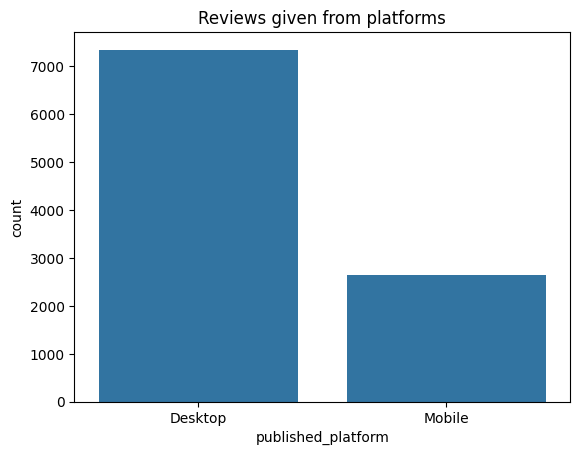

In [ ]:
sns.countplot(x='published_platform', data=df)
plt.title('Reviews given from platforms')
plt.show()

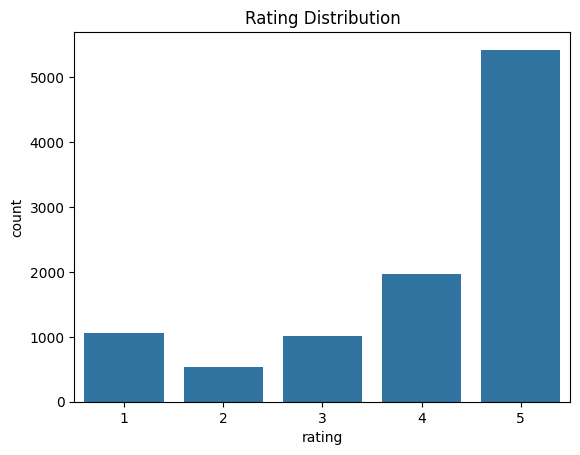

In [ ]:
sns.countplot(x='rating', data=df)
plt.title('Rating Distribution')
plt.show()

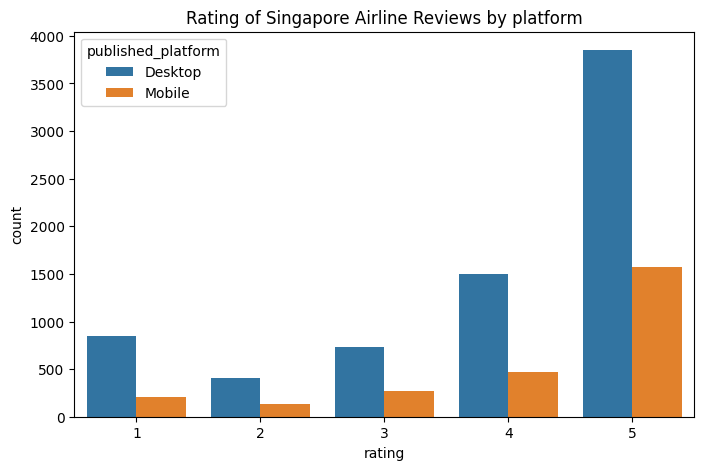

In [ ]:
plt.figure(figsize=(8,5))
sns.countplot(data=df, x="rating", hue="published_platform")
plt.title("Rating of Singapore Airline Reviews by platform")
plt.show()

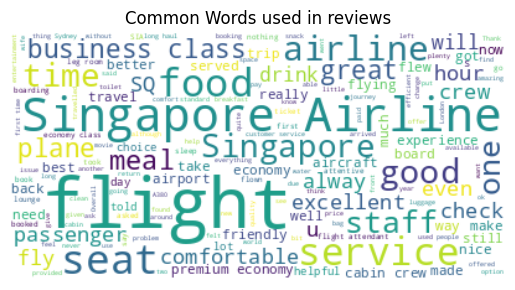

In [ ]:
texts = df.text.astype(str)
all_txt = " ".join(texts)

wc = WordCloud(background_color='white').generate(all_txt)

plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words used in reviews')
plt.show()

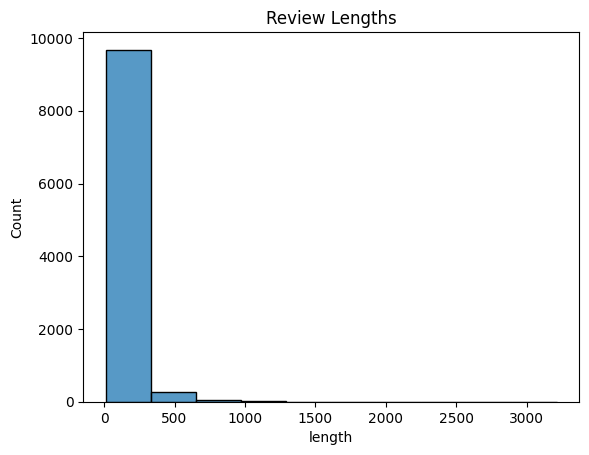

In [ ]:
texts = df.text.astype(str)
df['length'] = texts.apply(lambda x: len(x.split()))
sns.histplot(df.length, bins=10)
plt.title('Review Lengths')
plt.show()

In [ ]:
df_cleaned = df.dropna(subset=['published_date', 'text'])
analyzer = SentimentIntensityAnalyzer()

In [ ]:
def get_sentiment_category(text):
    sentiment_score = analyzer.polarity_scores(text)['compound']
    if sentiment_score >= 0.08:
        return 'Positive'
    elif sentiment_score <= -0.08:
        return 'Negative'
    else:
        return 'Neutral'
df_cleaned['text'] = df_cleaned['text'].apply(get_sentiment_category)
impact_distribution = df_cleaned['text'].value_counts()
print(impact_distribution)

text
Positive    8124
Negative    1718
Neutral      157
Name: count, dtype: int64


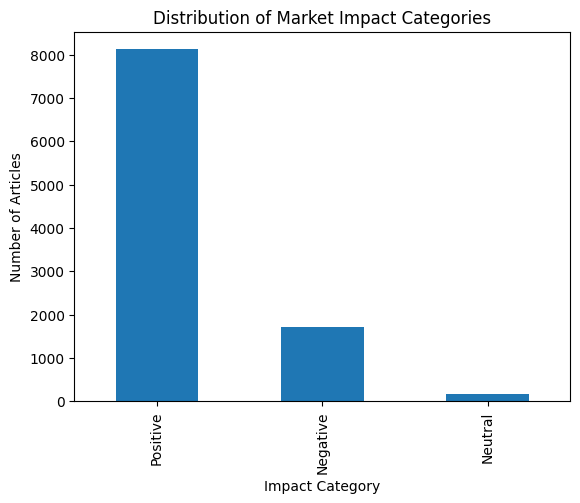

In [ ]:
impact_distribution.plot(kind='bar')
plt.title('Distribution of Market Impact Categories')
plt.xlabel('Impact Category')
plt.ylabel('Number of Articles')
plt.show()

With this we get to know that the maximum of our customers said something positive about our company.

Now let's  see what the top sayings.

In [ ]:
df['text'].head(20)

,text
0,We used this airline to go from Singapore to L...
1,The service on Singapore Airlines Suites Class...
2,"Booked, paid and received email confirmation f..."
3,"Best airline in the world, seats, food, servic..."
4,Premium Economy Seating on Singapore Airlines ...
5,We booked our flights a full 9 months in advan...
6,This was a fascinating experience. As I sat in...
7,Very bad expeirence for flight check in at bai...
8,"Respected Faculty, I am Bincy, writing this t..."
9,I would rate Singapore airlines the worse I ha...


# **Data Splitting**

Now we will split our data into test and train for modeling and training the data and thus implementing it.

In [ ]:
df_train, df_test = sklearn.model_selection.train_test_split(df, test_size = 0.33, stratify = df['rating'], random_state = 42)

print(df.shape)
print(df_train.shape)
print(df_test.shape)

(9999, 8)
(6699, 8)
(3300, 8)


# Data cleaning

Now we will be doing text cleaning where we will be removing the punctutations, lowercase and remove stop words.

Also we choose lemmatization over stemmer over here because it gives a better chance for retaining the meaning of the sentence where as in PotterStemmer the chances of loosing the meaning of the sentence.

In [ ]:
def clean_text_lemmatized(text):

    text = text.translate(str.maketrans('', '', string.punctuation))

    text = " ".join([word for word in str(text).lower().split() if word not in stopwords.words('english')])

    text = " ".join([WordNetLemmatizer().lemmatize(word) for word in text.split()])
    return text


Now we will have to combine all the cleaning function into a coloumn and do it for both train and test dataframe.

In [ ]:
df_train['text_cleaned'] = df_train['text'].apply(clean_text_lemmatized)
df_test['text_cleaned'] = df_test['text'].apply(clean_text_lemmatized)


Now we will try to get the list of first few cleaned text.

In [ ]:
print("Cleaned text in training data:")
display(df_train['text_cleaned'].head())
print("\nCleaned text in test data:")
display(df_test['text_cleaned'].head())

Cleaned text in training data:


,text_cleaned
7619,touched caring cabin staff knew bad tummy flig...
7378,first time flown singapore airline wont last s...
4559,singapore airline consistently provide good se...
512,booked flight 3 month advance ever since it’s ...
5718,researched singapore airline flew came best ec...



Cleaned text in test data:


,text_cleaned
4067,different flight makesstarted sq 221 bangkok s...
196,mother travelled lot excited see travel terrib...
6328,recent cruise ended singapore flight hk connec...
5423,singapore lovely sheet flat bed duvet business...
9885,new 380 extra row seat put pair galley door pa...


Now let's try to get the entity which are there in the text review.

In [ ]:
nlp = spacy.load('en_core_web_sm')
def extract_entities(text):
    doc = nlp(text)
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    return entities

df_train['entities'] = df_train['text_cleaned'].apply(extract_entities)

In [ ]:
df_train['entities']

,entities
7619,[]
7378,"[(first, ORDINAL), (singapore, GPE), (one, CAR..."
4559,"[(singapore, GPE), (one, CARDINAL)]"
512,"[(3 month, DATE), (first, ORDINAL), (late seco..."
5718,"[(singapore airline, ORG), (6, CARDINAL), (1, ..."
...,...
2151,"[(singapore, GPE), (brisbanewe, NORP), (singap..."
1623,[]
6259,"[(fourteen year, DATE)]"
4378,"[(one, CARDINAL)]"


# **Feature Engineering**

Now we here have 2 option for our feature engineering.

Starting with TFidF and Word2Vec which are traditional methods for which we will be doing logestic analysis.

In [ ]:
tfidf_vectorizer = TfidfVectorizer(max_features=5000)

tfidf_train = tfidf_vectorizer.fit_transform(df_train['text_cleaned'])

tfidf_test = tfidf_vectorizer.transform(df_test['text_cleaned'])

print("Shape of TF-IDF matrix for training data:", tfidf_train.shape)
print("Shape of TF-IDF matrix for test data:", tfidf_test.shape)

Shape of TF-IDF matrix for training data: (6699, 5000)
Shape of TF-IDF matrix for test data: (3300, 5000)


In [ ]:
tokenized_text = [simple_preprocess(doc) for doc in df_train['text_cleaned'].dropna()]

model = Word2Vec(sentences=tokenized_text, vector_size=100, window=5, min_count=1, workers=4)

try:
    vector = model.wv['great']
    print("Vector for 'great':", vector)
except KeyError:
    print("'great' not in vocabulary")

try:
    similar_words = model.wv.most_similar('good')
    print("Words similar to 'good':", similar_words)
except KeyError:
    print("'good' not in vocabulary")


Vector for 'great': [ 0.3063194   0.0775142   0.51409656 -0.7925305   0.73594517 -0.6687634
  0.5732746   1.2973741  -0.20893168 -1.6711068   0.23287012 -0.8854532
  0.298727    0.36947817 -0.04396194 -0.19040234  0.7684418  -0.71501577
 -0.54381967 -2.2339993   0.14864302  0.12916578  0.34419608 -0.366106
 -0.11141292 -0.26169074 -0.8452167   0.25179794 -0.4105685  -0.04895798
  0.57564694  0.37657994  0.11008558 -1.2813507  -0.76925033  0.9034282
  0.22169691 -0.8415417  -0.2146743  -0.96385723  0.05103173 -0.21810843
  0.35151187 -0.05965504  0.8281093   0.13496676  0.1480632  -0.3469057
  0.15501548  0.9656268   0.5004533  -0.5111372  -0.6513327  -0.2914544
  0.23455022 -0.6578463   1.1392441   0.07128516 -0.05395648  0.24044544
  0.09144738 -0.24160802  1.2473224   0.38288185 -1.34992     1.0364496
  0.08288185  0.67069745 -2.0930302   1.0867743   1.0548065   0.68789786
  1.5712284   0.9645472   0.6177444  -0.6757014   0.5515765   0.07878359
 -0.19148478  0.27477866 -0.6910369   0

## **Analysis:**  Here we can see that the model is able to recognise some of the key words which are there in the review(like: great, good, flight, awesome etc.)

# **Model training for TFidF and Word2Vec**

Now with TFidF and Word2Vec we will be doing our model training part which are traditoinal method and are done by logistic analysis.

Starting with splitting the lable data.

In [ ]:
X_train_tfidf = tfidf_train
y_train = df_train['rating']

X_test_tfidf = tfidf_test
y_test = df_test['rating']


Setting the model for 1000 iterations.

In [ ]:
log_reg_model = LogisticRegression(max_iter=1000)

Fitting the model.

In [ ]:
log_reg_model.fit(X_train_tfidf, y_train)

LogisticRegression(max_iter=1000)

In [ ]:
y_pred_tfidf = log_reg_model.predict(X_test_tfidf)

In [ ]:
accuracy_tfidf = accuracy_score(y_test, y_pred_tfidf)
report_tfidf = classification_report(y_test, y_pred_tfidf)
confusion_tfidf = confusion_matrix(y_test, y_pred_tfidf)

In [ ]:
print("\nLogistic Regression with TF-IDF Features:")
print(f"Accuracy: {accuracy_tfidf:.4f}")
print("Classification Report:")
print(report_tfidf)
print("Confusion Matrix:")
confusion_tfidf


Logistic Regression with TF-IDF Features:
Accuracy: 0.6709
Classification Report:
              precision    recall  f1-score   support

           1       0.69      0.70      0.70       349
           2       0.27      0.04      0.08       179
           3       0.44      0.31      0.36       333
           4       0.48      0.27      0.34       649
           5       0.73      0.94      0.82      1790

    accuracy                           0.67      3300
   macro avg       0.52      0.45      0.46      3300
weighted avg       0.62      0.67      0.63      3300

Confusion Matrix:


array([[ 246,   12,   31,    7,   53],
       [  47,    8,   63,   23,   38],
       [  34,    7,  103,   78,  111],
       [  13,    3,   31,  174,  428],
       [  18,    0,    5,   84, 1683]])

Through this we get to know that our model is able to attain 67% accuracy using this model.

# Fine-tuning BERT for Sequence Classification

Now coming from the traditional method we will shift to the modern method of model.

As bert is very powerful model and takes many parameters into consideration it is not possible to consider each and every characters into consideration so we will have to take a sample.

In [ ]:
X_train = df_train['text_cleaned']
y_train = df_train['rating']

We will try to oversample all the classes to get the same number of samples as we get from the majority class.

In [ ]:
ros = RandomOverSampler(random_state=42)

In [ ]:
X_train_resampled, y_train_resampled = ros.fit_resample(X_train.values.reshape(-1, 1), y_train)


Now we bring back our data to pandas series.

In [ ]:
X_train_resampled = pd.Series(X_train_resampled.flatten())
y_train_resampled = pd.Series(y_train_resampled)

print("Shape of original training data:", df_train.shape)
print("Shape of resampled training data:", X_train_resampled.shape)
print("\nDistribution of ratings in original training data:")
print(y_train.value_counts())
print("\nDistribution of ratings in resampled training data:")
print(y_train_resampled.value_counts())

Shape of original training data: (6699, 10)
Shape of resampled training data: (18170,)

Distribution of ratings in original training data:
rating
5    3634
4    1318
1     708
3     676
2     363
Name: count, dtype: int64

Distribution of ratings in resampled training data:
rating
5    3634
1    3634
4    3634
2    3634
3    3634
Name: count, dtype: int64


And bring back tokenization for our bert analysis.

In [ ]:
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

train_encodings = tokenizer(X_train_resampled.tolist(), truncation=True, padding=True, max_length = 128)
test_encodings = tokenizer(df_test['text_cleaned'].tolist(), truncation=True, padding=True, max_length = 128)

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

Now we perform encoding of our bert model.

In [ ]:
train_encodings

{'input_ids': [[101, 5028, 11922, 6644, 3095, 2354, 2919, 10722, 18879, 3462, 2234, 2116, 2051, 3198, 3110, 5632, 6625, 3462, 1999, 28968, 3185, 2204, 2116, 4989, 5454, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 2034, 2051, 10583, 5264, 8582, 2180, 2102, 2197, 2326, 8987, 3243, 5793, 2617, 7039, 2051, 2288, 3462, 6581, 2326, 2598, 3095, 3462, 16742, 2559, 2830, 3909, 1037, 22025, 2692, 9364, 4946, 4251, 2130, 3194, 2440, 2373, 2449, 2465, 2835, 2898, 2564, 2071, 2941, 4133, 2362, 2028, 2835, 2172, 2282, 2835, 4201, 4257, 2191, 2793, 4983, 17077, 4206, 20851, 2282, 17414, 5660, 2187, 2833, 3599, 3641, 6581, 2833, 19645, 2126, 3994, 5264, 3462, 16742, 5121, 2113, 2298, 4628, 3243, 5151, 2498, 2172, 4390, 10583, 3802, 

Now it is important to get weights to our classes as it helps us in balancing our dataset.

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(class_weight='balanced',
                                     classes=np.unique(y_train),
                                     y=y_train)

class_weights_dict = {i: weight for i, weight in enumerate(class_weights)}
class_weights = torch.tensor(class_weights, dtype=torch.float)

Now Bert has a pretraining mode for sequencial classification data which we need to load in and since we have a set of lable we will define them according to it.

In [ ]:
num_labels = len(df['rating'].unique())

model = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased", num_labels=num_labels)

print(f"Loaded BERT tokenizer: {model}")

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loaded BERT tokenizer: DistilBertForSequenceClassification(
  (distilbert): DistilBertModel(
    (embeddings): Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (transformer): Transformer(
      (layer): ModuleList(
        (0-5): 6 x TransformerBlock(
          (attention): DistilBertSdpaAttention(
            (dropout): Dropout(p=0.1, inplace=False)
            (q_lin): Linear(in_features=768, out_features=768, bias=True)
            (k_lin): Linear(in_features=768, out_features=768, bias=True)
            (v_lin): Linear(in_features=768, out_features=768, bias=True)
            (out_lin): Linear(in_features=768, out_features=768, bias=True)
          )
          (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (ffn): FFN(
            (dropout): Dropout

Now we need to make our computer understand our textual dataset and we will now make it learn our text dataset.

Code Source: https://text-docs.readthedocs.io/en/latest/_modules/torchtext/data/dataset.html

In [ ]:
class TextDataset(torch.utils.data.Dataset):
  def __init__(self, encodings, labels):
      self.encodings = encodings
      self.labels = labels

  def __getitem__(self, idx):
    return {
          'input_ids': torch.tensor(self.encodings['input_ids'][idx]),
          'attention_mask': torch.tensor(self.encodings['attention_mask'][idx]),
          'labels': torch.tensor(self.labels[idx] - 1, dtype=torch.long)  # Adjust labels to be 0-indexed
      }

  def __len__(self):
    return len(self.labels)



In [ ]:
train_dataset = TextDataset(train_encodings, y_train.reset_index(drop=True))
test_dataset = TextDataset(test_encodings, y_test.reset_index(drop=True))

Now to customize the training process to give more importance to certain categories specifically rating we perform this model.


Code source: https://discuss.huggingface.co/t/how-can-i-use-class-weights-when-training/1067/6

In [ ]:
class WeightedTrainer(Trainer):
    def __init__(self, class_weights, *args, **kwargs):
        super().__init__(*args, **kwargs)

        self.class_weights = class_weights.to(self.model.device)

    def compute_loss(self, model, inputs, return_outputs=False, num_items_in_batch=None):
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")
        loss_fct = nn.CrossEntropyLoss(weight=self.class_weights)
        loss = loss_fct(logits.view(-1, self.model.config.num_labels), labels.view(-1))
        return (loss, outputs) if return_outputs else loss

Now we need to define specif parameters for our modeling process.

Code source: https://huggingface.co/transformers/v3.0.2/main_classes/trainer.html

In [ ]:
training_args = TrainingArguments(
    output_dir="./results",
    num_train_epochs=3,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=8,
    eval_strategy="epoch",
    logging_strategy="epoch",
    logging_dir="./logs",
    report_to="none",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="accuracy",
)

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = logits.argmax(axis=1)
    acc = accuracy_score(labels, predictions)
    return {"accuracy": acc}




And we need to define our trainer.

In [ ]:
trainer = WeightedTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    compute_metrics=compute_metrics,
    class_weights=class_weights
)

In [ ]:
trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy
1,1.186900,1.126313,0.639091
2,0.953300,1.247829,0.678788
3,0.759600,1.519055,0.664545


TrainOutput(global_step=5025, training_loss=0.9665895619558458, metrics={'train_runtime': 725.1796, 'train_samples_per_second': 27.713, 'train_steps_per_second': 6.929, 'total_flos': 665584935079680.0, 'train_loss': 0.9665895619558458, 'epoch': 3.0})

# **Evaluate the model**

In [ ]:
results = trainer.evaluate()
print(results)

{'eval_loss': 1.2478290796279907, 'eval_accuracy': 0.6787878787878788, 'eval_runtime': 19.1764, 'eval_samples_per_second': 172.087, 'eval_steps_per_second': 21.537, 'epoch': 3.0}


Now we define our prediction model to attain the confusion matrix.

In [ ]:
y_pred_bert = trainer.predict(test_dataset).predictions.argmax(axis=1)

y_pred_bert_adjusted = y_pred_bert + 1

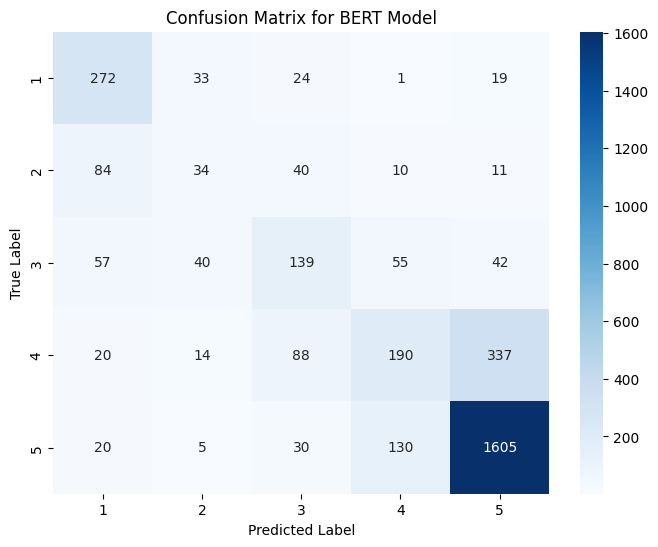

In [ ]:
cm_bert = confusion_matrix(y_test, y_pred_bert_adjusted)


plt.figure(figsize=(8, 6))
sns.heatmap(cm_bert, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.title('Confusion Matrix for BERT Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# **Conclusion & Findings**

1. The model (specially logistic regression) is ideal for word recognition as we can see that the model is able to recognise the words like good, great, awesome flight with more than 92+ accuracy.

2. The model is able to help Singapore Airlines to help them understand the sentiments of their customers which is most of them are satified with the airline.

3. The model may have a less accuracy score which according to my analysis is because their are certain coloummns which don't have well explained coloumns which creates a difficult chance for the model to understand what exactly is being addressed over here.

4. For the above data set both BERT and Traditional method(Logistic regression) drew the same conclusion and can be used for the dataset.

